In [7]:
import numpy as np
import matplotlib.pyplot as plt

from astropy.table import Table
import astropy.units as u
import astropy.coordinates as coord

# this will require installing gala, see here: http://gala.adrian.pw/en/latest/index.html
import gala.coordinates as gc
import gala.potential as gp
import gala.dynamics as gd
from gala.units import galactic
from gala.dynamics.nbody import DirectNBody
import gala.integrate as gi

%matplotlib inline
%config InlineBackend.figure_format='retina'

In [8]:
from helpers.SimulationAnalysis import SimulationAnalysis, iterTrees
from helpers.SimulationAnalysis import readHlist

h = 0.7

In [9]:
#Path to simulation data
path_to_data = ''

#Halo properties to load; see Section 2.4 of https://arxiv.org/abs/2008.08591 for info on Rockstar fields 
fields = ['scale','id', 'upid', 'pid', 'mvir', 'mpeak', 'rvir', 'rs', 'vmax', 'vpeak', 'x', 'y', 'z', 'vx', 'vy', 'vz',
          'M200c', 'depth_first_id','scale_of_last_MM']

#Load z = 0 halo list for Halo416_16K
halos_z0 = readHlist(path_to_data+'hlist_1.00000.list',fields=fields)
MW_analog = halos_z0[np.argmax(halos_z0['mvir'])]

subhalos_z0 = halos_z0[halos_z0['upid']==MW_analog['id']]
LMC_analog = subhalos_z0[np.argmax(subhalos_z0['mvir'])]

ind_lmc = subhalos_z0['pid']==LMC_analog['id']

(63.0, 65.0)

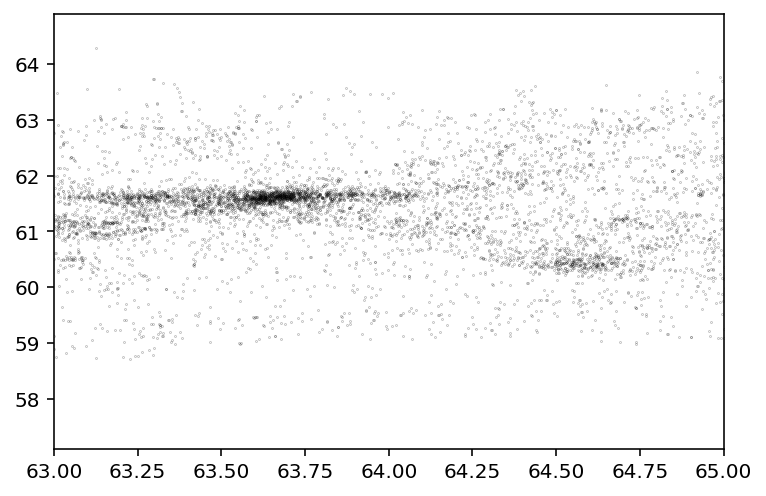

In [10]:
mass = halos_z0['mvir']>10**7
#mass
plt.plot(halos_z0['x'][mass], halos_z0['y'][mass], '.k', ms=0.2)
plt.xlim(63,65)

In [11]:
ts = Table(subhalos_z0)
for comp in ['x', 'y', 'z']:
    ts[comp] = ((ts[comp] - MW_analog[comp])*u.Mpc*h).to(u.kpc)
for comp in ['vx', 'vy', 'vz']:
    ts[comp] = (ts[comp] - MW_analog[comp])*u.km/u.s

In [12]:
ts

scale,id,upid,pid,mvir,mpeak,rvir,rs,vmax,vpeak,x,y,z,vx,vy,vz,M200c,depth_first_id,scale_of_last_MM
,,,,,,,,,,kpc,kpc,kpc,km / s,km / s,km / s,,,
float32,int64,int64,int64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,int64,float32
1.0,72389918,72436634,72436634,121600000000.0,206200000000.0,101.773,4.764,102.93,120.27,-44.59648,-15.912246,12.998961,-159.72,-152.91,220.94998,108180000000.0,5703913,0.86916
1.0,72381154,72436634,72389918,52640000000.0,80970000000.0,76.993,2.263,83.54,92.67,-51.192093,-27.236938,4.8332214,-93.56,172.27,147.20001,49735000000.0,8611404,0.3844
1.0,72450379,72436634,72436634,25110000000.0,25770000000.0,60.159,3.509,57.99,60.05,130.68924,26.871109,-33.058167,-211.34,-91.35,90.20999,22407000000.0,10225037,0.14041
1.0,72380335,72436634,72381154,10810000000.0,14490000000.0,45.421,1.259,50.16,57.87,-48.153305,-70.784,-12.69989,-161.14,-107.18,80.73001,10592000000.0,11918987,0.21659
1.0,72399577,72436634,72389918,3983000000.0,9972000000.0,32.565,0.554,42.48,51.68,-38.711163,27.45323,13.16452,-198.3,-31.739998,-109.34999,3967400000.0,13915491,0.32569
1.0,72429554,72436634,72436634,3785000000.0,7354000000.0,32.015,0.553,41.1,51.66,6.3125606,-127.00958,68.925476,-24.48,57.06,-44.14,3670100000.0,14123818,0.18587
1.0,72379878,72436634,72381154,2448000000.0,2476000000.0,27.688,0.322,39.3,41.57,-22.750854,-49.659344,-16.12854,-2.9899979,102.56,28.52002,2368500000.0,15028216,0.52867
1.0,72454407,72436634,72436634,1986000000.0,2466000000.0,25.824,0.558,31.43,37.15,43.133163,68.43147,28.871155,152.19,47.870003,-83.98999,1944300000.0,15452340,0.09103


In [13]:
ts.write('subhalos.csv', overwrite=True)

In [14]:
# in our case, we'll define the gravitational potential with the mass and scale radius of the MW_analog halo
ham = gp.Hamiltonian(gp.NFWPotential(m=MW_analog['mvir']*h*u.Msun, r_s=MW_analog['rs']*h*u.kpc, units=galactic))

In [15]:
# now let's choose a starting point (3D position and 3D velocity) for the orbit
x = 300*u.kpc
y = 0*u.kpc
z = 0*u.kpc
vx = 30*u.km/u.s
vy = 20*u.km/u.s
vz = 0*u.km/u.s

c = coord.Galactocentric(x=x, y=y, z=z, v_x=vx, v_y=vy, v_z=vz)
w0 = gd.PhaseSpacePosition(c.cartesian) #starting position of orbit

In [16]:
Nstep = 50000
dt = -1*u.Myr #neg means calculating back in time 
orbit = ham.integrate_orbit(w0, dt=dt, n_steps=Nstep)

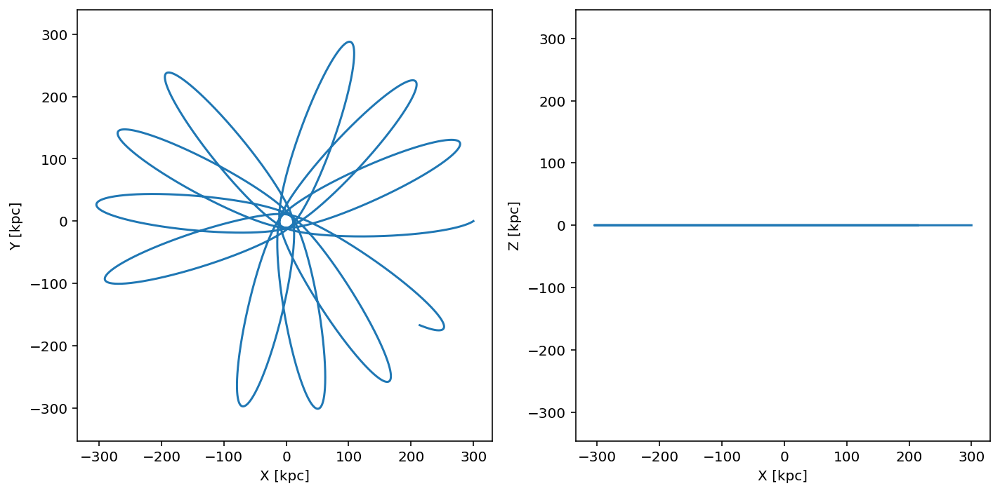

In [17]:
fig, ax = plt.subplots(1,2,figsize=(10,5))

plt.sca(ax[0])
plt.plot(orbit.pos.x, orbit.pos.y, '-')
plt.gca().set_aspect('equal', adjustable='datalim')
plt.xlabel('X [kpc]')
plt.ylabel('Y [kpc]')

plt.sca(ax[1])
plt.plot(orbit.pos.x, orbit.pos.z, '-')
plt.gca().set_aspect('equal', adjustable='datalim')
plt.xlabel('X [kpc]')
plt.ylabel('Z [kpc]')

plt.tight_layout()

In [18]:
t = Table.read('snapshot_now.fits')

In [19]:
h=0.7
subhalos_z0['x'] = (subhalos_z0['x'] - MW_analog['x'])*1000/h
subhalos_z0['y'] = (subhalos_z0['y'] - MW_analog['y'])*1000/h
subhalos_z0['z'] = (subhalos_z0['z'] - MW_analog['z'])*1000/h

(-100.0, 100.0)

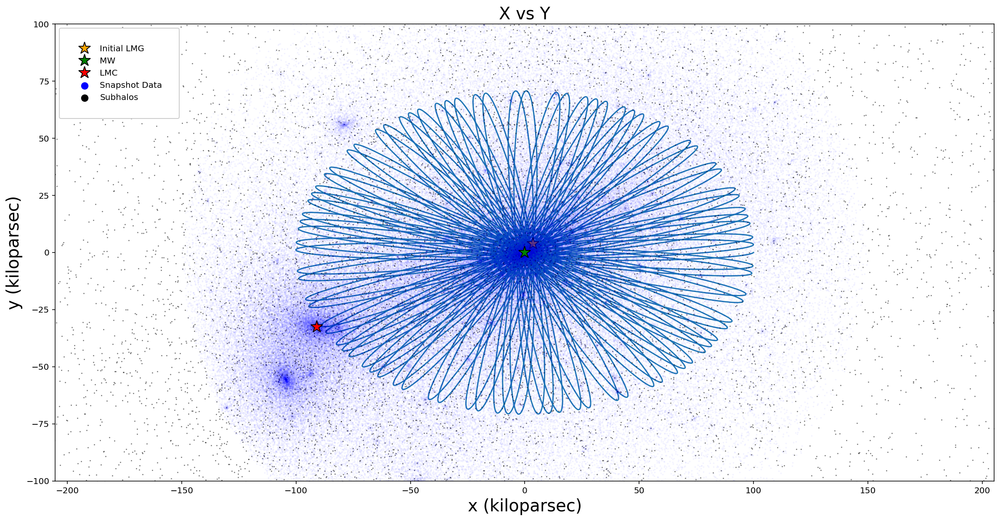

In [20]:
fig, ax = plt.subplots(1,1,figsize=(20,10))
#choosing velocities & initial positions
x = 100*u.kpc
y = 0*u.kpc
z = 0*u.kpc
vx = 10*u.km/u.s
vy = 10*u.km/u.s
vz = 10*u.km/u.s
c = coord.Galactocentric(x=x, y=y, z=z, v_x=vx, v_y=vy, v_z=vz)
w0 = gd.PhaseSpacePosition(c.cartesian)
Nstep = 100000 #large step number for more definition
dt = -1*u.Myr #negative means calculating back in time 
orbit = ham.integrate_orbit(w0, dt=dt, n_steps=Nstep)

#This plot shows the trajectory of a particle at position (100,0,0)
plt.plot(orbit.pos.x, orbit.pos.y, '-')
plt.plot(orbit.pos.x[-1], orbit.pos.y[-1], '*', color='orange', ms=15, mec='k', label='Initial LMG')
plt.gca().set_aspect('equal', adjustable='datalim')
plt.plot(subhalos_z0['x'], subhalos_z0['y'], 'k.', ms=1, alpha=0.5) #1 Mega Parsec = 1000 Kilo Parsec 
plt.plot(t['x'],t['y'],color='blue',marker='o',ms=1,ls='None', alpha = 0.03)
plt.plot(0, 0, 'g*', mec='k', ms=15, label='MW')
plt.plot(LMC_analog['x'], LMC_analog['y'], 'r*', mec='k', ms=15, alpha=1, label='LMC')
plt.scatter(1000,10000, marker='o', color='blue', s=60, label='Snapshot Data')
plt.scatter(1000,10000, marker='o', color='black', s=60, label='Subhalos')
plt.xlabel('x (kiloparsec)', fontsize=20)
plt.ylabel('y (kiloparsec)', fontsize=20)
plt.title('X vs Y', fontsize=20)
plt.legend(loc='best')
plt.legend(facecolor='white', framealpha=1, borderpad=2, loc='best')
plt.xlim(-100,100)
plt.ylim(-100,100)



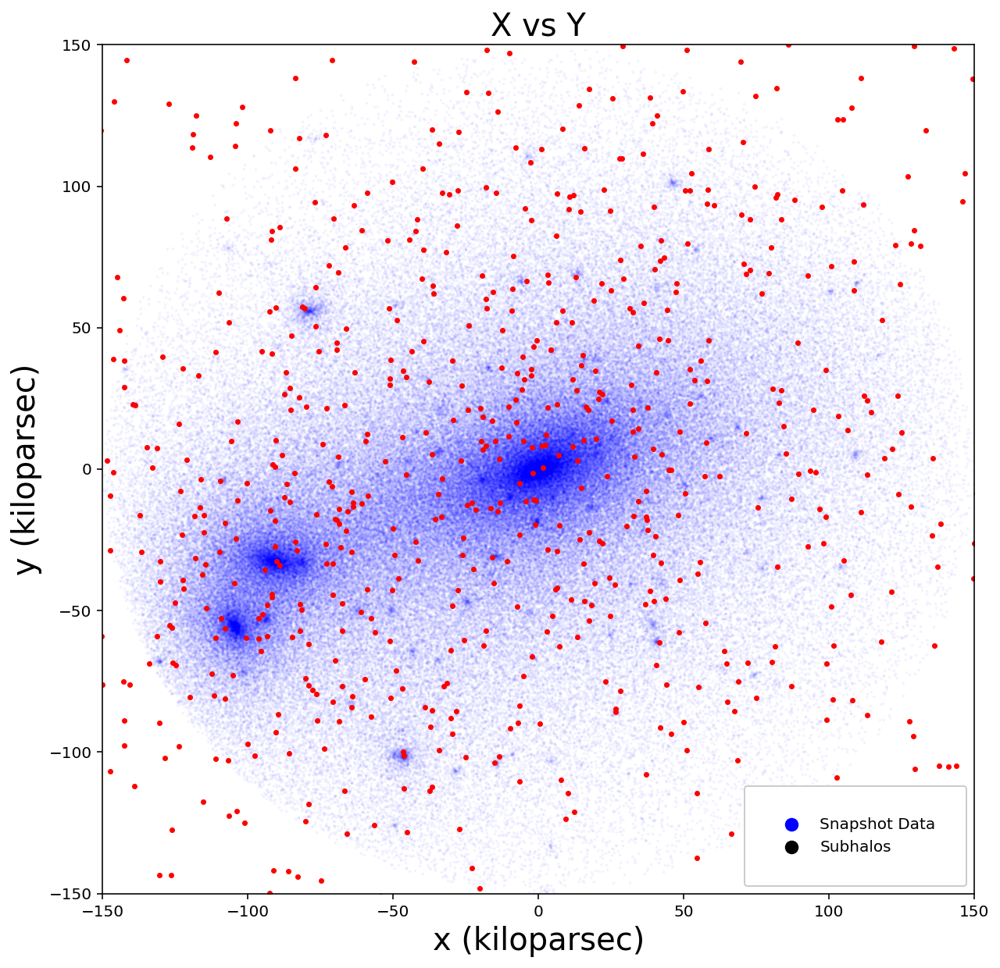

In [21]:
ind_massive = (subhalos_z0['mvir'] > 10**7) & (subhalos_z0['mvir'] < 10**8)

f = plt.figure()
f.set_figwidth(10)
f.set_figheight(10)
plt.plot(subhalos_z0['x'][ind_massive], subhalos_z0['y'][ind_massive], '.r', ms = 5)
plt.plot(t['x'],t['y'],color='blue',marker='o',ms=1,ls='None', alpha = 0.03, zorder=0)
#plt.plot(subhalos_z0['x'], subhalos_z0['y'], 'or', ms = 0.5)
plt.scatter(1000,10000, marker='o', color='blue', s=60, label='Snapshot Data')
plt.scatter(1000,10000, marker='o', color='black', s=60, label='Subhalos')
plt.xlabel('x (kiloparsec)', fontsize=20)
plt.ylabel('y (kiloparsec)', fontsize=20)
plt.title('X vs Y', fontsize=20)
plt.legend(loc='best')
plt.legend(facecolor='white', framealpha=1, borderpad=2, loc='best')
plt.xlim(-150,150)
plt.ylim(-150,150)
plt.savefig('Week4 Figurept1')

In [22]:
#plt.plot(subhalos_z0['x'][ind_massive], subhalos_z0['y'][ind_massive], 'o')

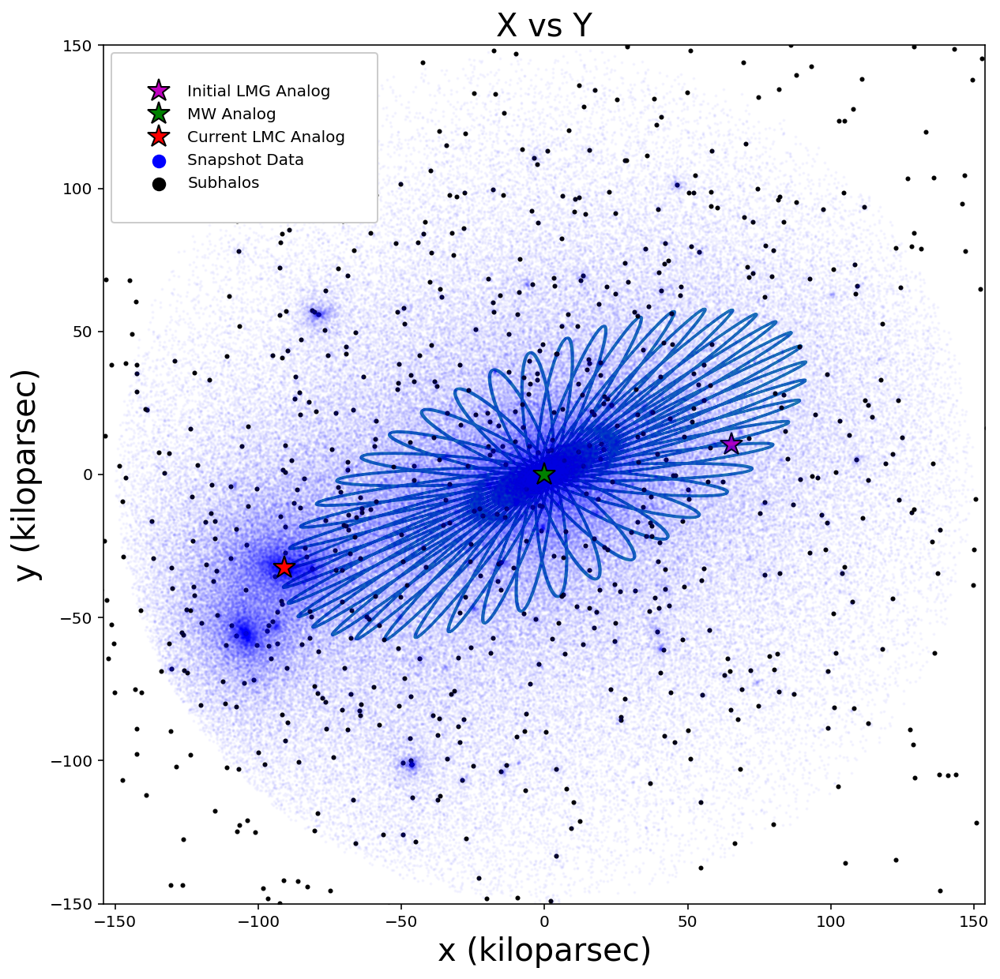

In [23]:
x = LMC_analog['x']*u.kpc
y = LMC_analog['y']*u.kpc
z = LMC_analog['z']*u.kpc
vx = 10*u.km/u.s
vy = 10*u.km/u.s
vz = 10*u.km/u.s
c = coord.Galactocentric(x=x, y=y, z=z, v_x=vx, v_y=vy, v_z=vz)
w0 = gd.PhaseSpacePosition(c.cartesian)
Nstep = 100000 #large step number for more definition
dt = -1*u.Myr #negative means calculating back in time 
orbit = ham.integrate_orbit(w0, dt=dt, n_steps=Nstep)
ind_massive = subhalos_z0['mvir'] > 10**7

f = plt.figure()
f.set_figwidth(10)
f.set_figheight(10)
plt.plot(orbit.pos.x, orbit.pos.y, '-')
plt.plot(orbit.pos.x[-1], orbit.pos.y[-1], '*m', ms=15, mec='k', label='Initial LMG Analog')
plt.gca().set_aspect('equal', adjustable='datalim')
plt.plot(subhalos_z0['x'][ind_massive], subhalos_z0['y'][ind_massive], '.k', ms = 4)
#plt.plot(subhalos_z0['x'], subhalos_z0['y'], 'k.', ms=1, alpha=0.5) #1 Mega Parsec = 1000 Kilo Parsec 
plt.plot(t['x'],t['y'],color='blue',marker='o',ms=1,ls='None', alpha = 0.03)
plt.plot(0, 0, 'g*', mec='k', ms=15, label='MW Analog')
plt.plot(LMC_analog['x'], LMC_analog['y'], 'r*', mec='k', ms=15, alpha=1, label='Current LMC Analog')
plt.scatter(1000,10000, marker='o', color='blue', s=60, label='Snapshot Data')
plt.scatter(1000,10000, marker='o', color='black', s=60, label='Subhalos')
plt.xlabel('x (kiloparsec)', fontsize=20)
plt.ylabel('y (kiloparsec)', fontsize=20)
plt.title('X vs Y', fontsize=20)
plt.legend(loc='best')
plt.legend(facecolor='white', framealpha=1, borderpad=2, loc='best')

plt.xlim(-150,150)
plt.ylim(-150,150)
plt.savefig('Week4 Figurept2')

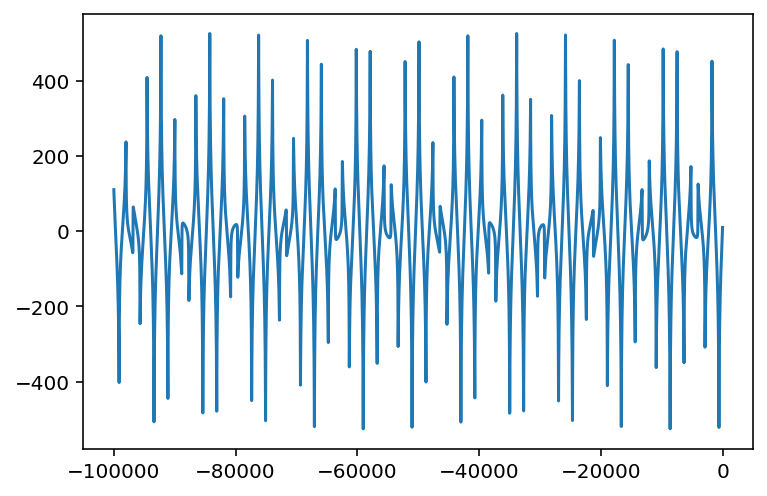

In [24]:
plt.plot(orbit.t, orbit.vel.d_x.to(u.km/u.s), '-')

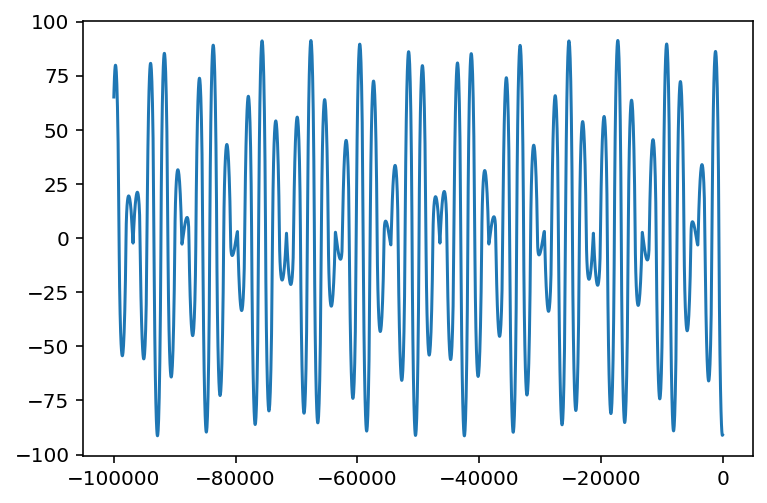

In [25]:
plt.plot(orbit.t, orbit.pos.x)

In [26]:
LMC_analog['vx']

-96.33

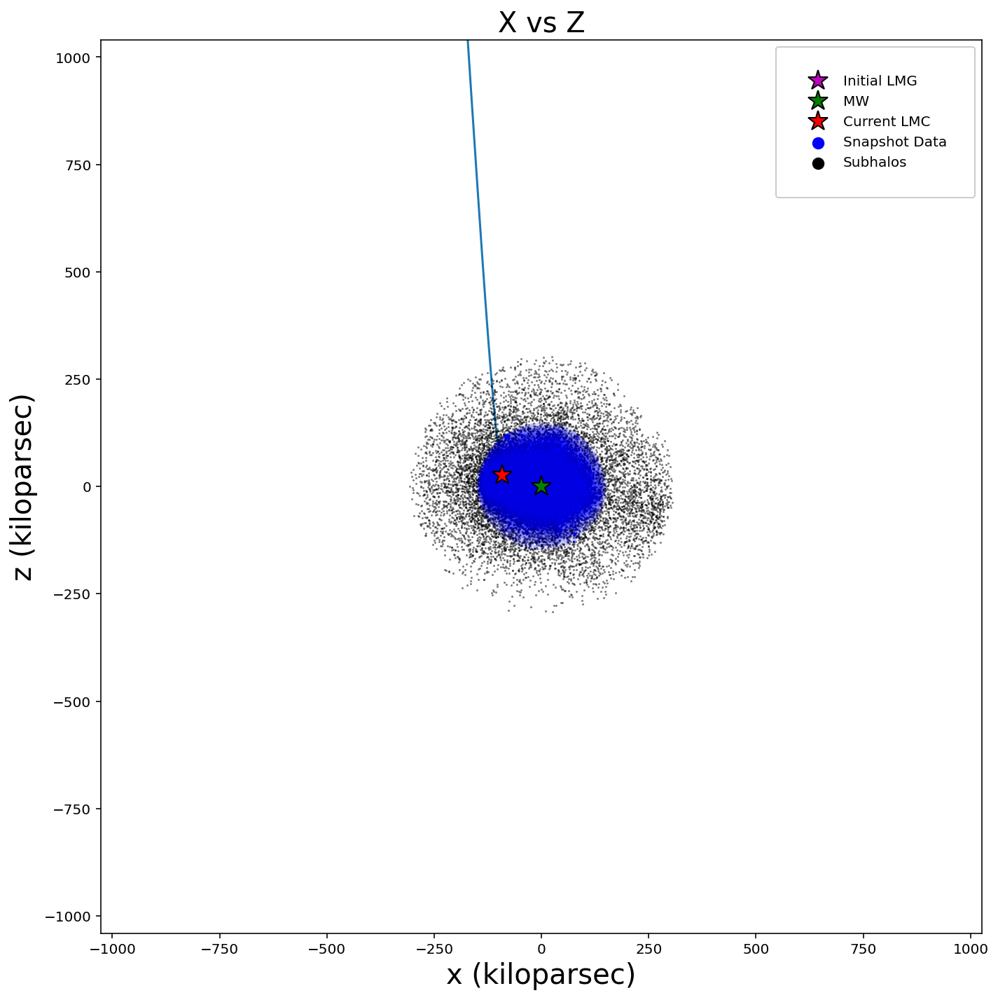

In [27]:
x = LMC_analog['x']*u.kpc
y = LMC_analog['y']*u.kpc
z = LMC_analog['z']*u.kpc
vx = LMC_analog['vx']*u.km/u.s
vy = LMC_analog['vy']*u.km/u.s
vz = LMC_analog['vz']*u.km/u.s
c = coord.Galactocentric(x=x, y=y, z=z, v_x=vx, v_y=vy, v_z=vz)
w0 = gd.PhaseSpacePosition(c.cartesian)
Nstep = 100000 #large step number for more definition
dt = 1*u.Myr #negative means calculating back in time 
orbit = ham.integrate_orbit(w0, dt=dt, n_steps=Nstep)

f = plt.figure()
f.set_figwidth(10)
f.set_figheight(10)
plt.plot(orbit.pos.x, orbit.pos.z, '-')
plt.plot(orbit.pos.x[-1], orbit.pos.z[-1], '*m', ms=15, mec='k', label='Initial LMG')
plt.gca().set_aspect('equal', adjustable='datalim')
plt.plot(subhalos_z0['x'], subhalos_z0['z'], 'k.', ms=1, alpha=0.5) #1 Mega Parsec = 1000 Kilo Parsec 
plt.plot(t['x'],t['z'],color='blue',marker='o',ms=1,ls='None', alpha = 0.03)
plt.plot(0, 0, 'g*', mec='k', ms=15, label='MW')
plt.plot(LMC_analog['x'], LMC_analog['z'], 'r*', mec='k', ms=15, alpha=1, label='Current LMC')
plt.scatter(1000,10000, marker='o', color='blue', s=60, label='Snapshot Data')
plt.scatter(1000,10000, marker='o', color='black', s=60, label='Subhalos')
plt.xlabel('x (kiloparsec)', fontsize=20)
plt.ylabel('z (kiloparsec)', fontsize=20)
plt.title('X vs Z', fontsize=20)
plt.legend(loc='best')
plt.legend(facecolor='white', framealpha=1, borderpad=2, loc='best')
plt.xlim(-1000,1000)
plt.ylim(-1000,1000)

plt.tight_layout()

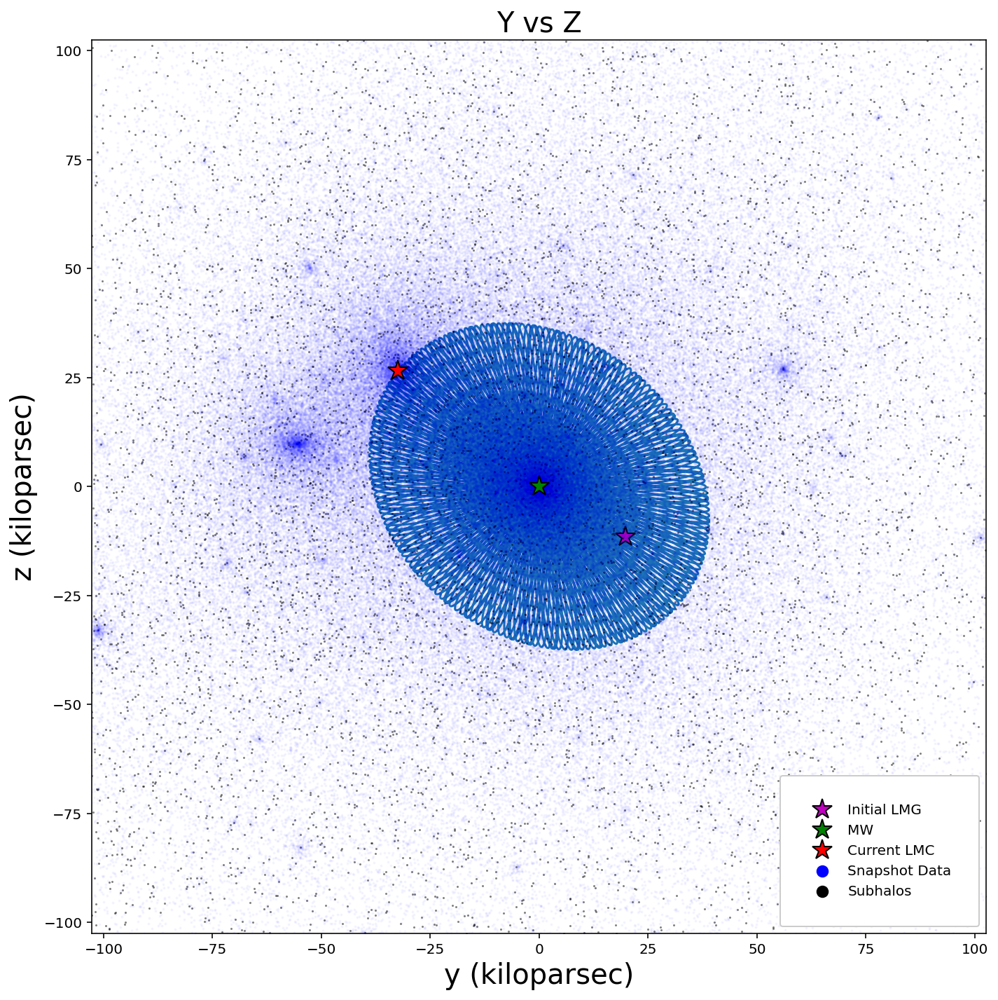

In [28]:
x = 0*u.kpc
y = LMC_analog['y']*u.kpc
z = LMC_analog['z']*u.kpc
vx = 10*u.km/u.s
vy = 10*u.km/u.s
vz = 10*u.km/u.s
c = coord.Galactocentric(x=x, y=y, z=z, v_x=vx, v_y=vy, v_z=vz)
w0 = gd.PhaseSpacePosition(c.cartesian)
Nstep = 100000 #large step number for more definition
dt = -1*u.Myr #negative means calculating back in time 
orbit = ham.integrate_orbit(w0, dt=dt, n_steps=Nstep)

f = plt.figure()
f.set_figwidth(10)
f.set_figheight(10)
plt.plot(orbit.pos.y, orbit.pos.z, '-')
plt.plot(orbit.pos.y[-1], orbit.pos.z[-1], '*m', ms=15, mec='k', label='Initial LMG')
plt.gca().set_aspect('equal', adjustable='datalim')
plt.plot(subhalos_z0['y'], subhalos_z0['z'], 'k.', ms=1, alpha=0.5) #1 Mega Parsec = 1000 Kilo Parsec 
plt.plot(t['y'],t['z'],color='blue',marker='o',ms=1,ls='None', alpha = 0.03)
plt.plot(0, 0, 'g*', mec='k', ms=15, label='MW')
plt.plot(LMC_analog['y'], LMC_analog['z'], 'r*', mec='k', ms=15, alpha=1, label='Current LMC')
plt.scatter(1000,10000, marker='o', color='blue', s=60, label='Snapshot Data')
plt.scatter(1000,10000, marker='o', color='black', s=60, label='Subhalos')
plt.xlabel('y (kiloparsec)', fontsize=20)
plt.ylabel('z (kiloparsec)', fontsize=20)
plt.title('Y vs Z', fontsize=20)
plt.legend(loc='best')
plt.legend(facecolor='white', framealpha=1, borderpad=2, loc='best')
plt.xlim(-100,100)
plt.ylim(-100,100)

plt.tight_layout()

In [29]:
%matplotlib notebook

<IPython.core.display.Javascript object>


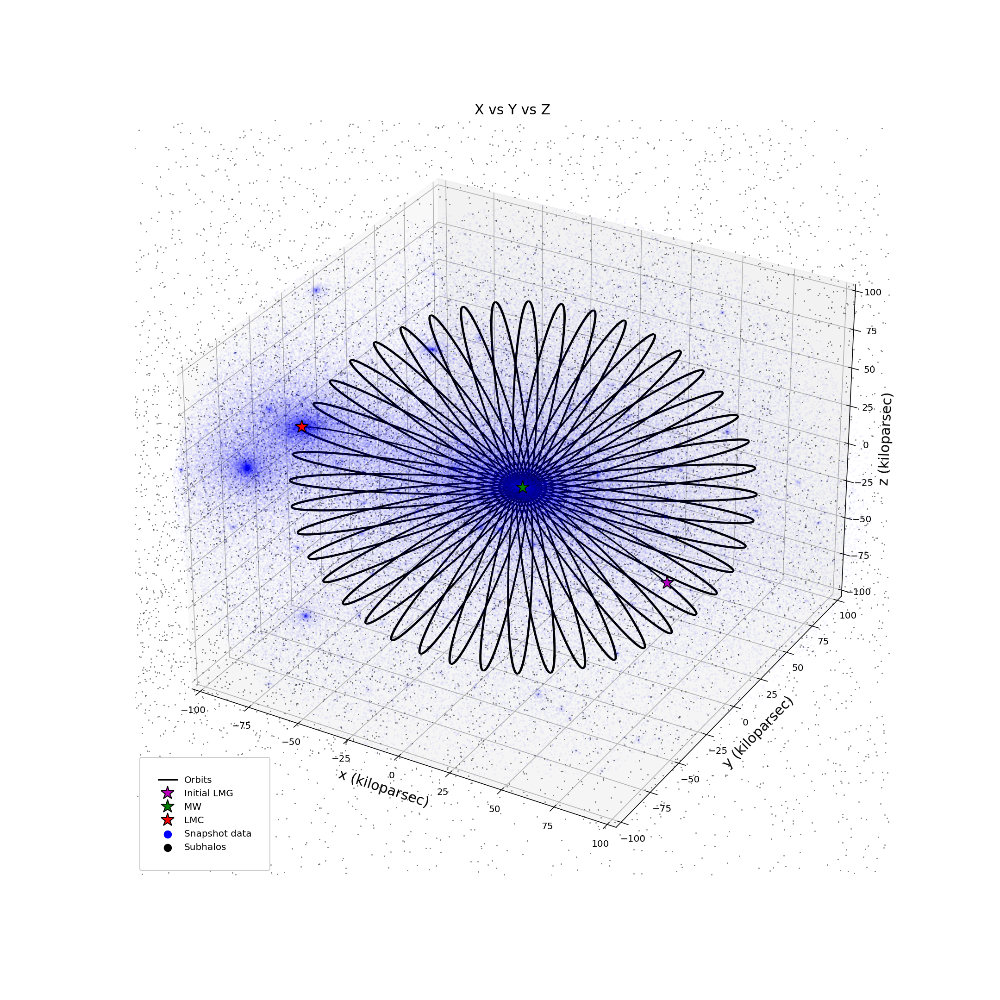

In [30]:
x = LMC_analog['x']*u.kpc
y = LMC_analog['y']*u.kpc
z = LMC_analog['z']*u.kpc
vx = 10*u.km/u.s
vy = 10*u.km/u.s
vz = 10*u.km/u.s
c = coord.Galactocentric(x=x, y=y, z=z, v_x=vx, v_y=vy, v_z=vz)
w0 = gd.PhaseSpacePosition(c.cartesian)
Nstep = 100000 #large step number for more definition
dt = -1*u.Myr #negative means calculating back in time 
orbit = ham.integrate_orbit(w0, dt=dt, n_steps=Nstep)

f = plt.figure()
f.set_figwidth(15)
f.set_figheight(15)

ax = plt.axes(projection='3d')

ax.plot(orbit.pos.x, orbit.pos.y, orbit.pos.z, '-', color='black', ms=0.1, label='Orbits')
ax.plot(orbit.pos.x[-1], orbit.pos.y[-1], orbit.pos.z[-1], '*m', ms=15, mec='k', label='Initial LMG')

ax.plot(subhalos_z0['x'], subhalos_z0['y'], subhalos_z0['z'], 'k.', ms=1, alpha=0.5) #1 Mega Parsec = 1000 Kilo Parsec 
ax.plot(t['x'], t['y'],t['z'],color='blue',marker='o', ms=1,ls='None', alpha = 0.03)
ax.plot(0, 0, 0, 'g*', mec='k', ms=15, label='MW')
ax.plot(LMC_analog['x'], LMC_analog['y'], LMC_analog['z'], 'r*', mec='k', ms=15, alpha=1, label='LMC')
ax.scatter(1000,10000, marker='o', color='blue', s=60, label='Snapshot data')
ax.scatter(1000,10000, marker='o', color='black', s=60, label='Subhalos')
ax.set_xlabel('x (kiloparsec)', fontsize=15)
ax.set_ylabel('y (kiloparsec)', fontsize=15)
ax.set_zlabel('z (kiloparsec)', fontsize=15)
plt.title('X vs Y vs Z', fontsize=15)
plt.legend(facecolor='white', framealpha=1, borderpad=2, loc='best')
ax.set_xlim(-100,100)
ax.set_ylim(-100,100)
ax.set_zlim(-100,100)
plt.savefig('Week3 Figures')


<IPython.core.display.Javascript object>


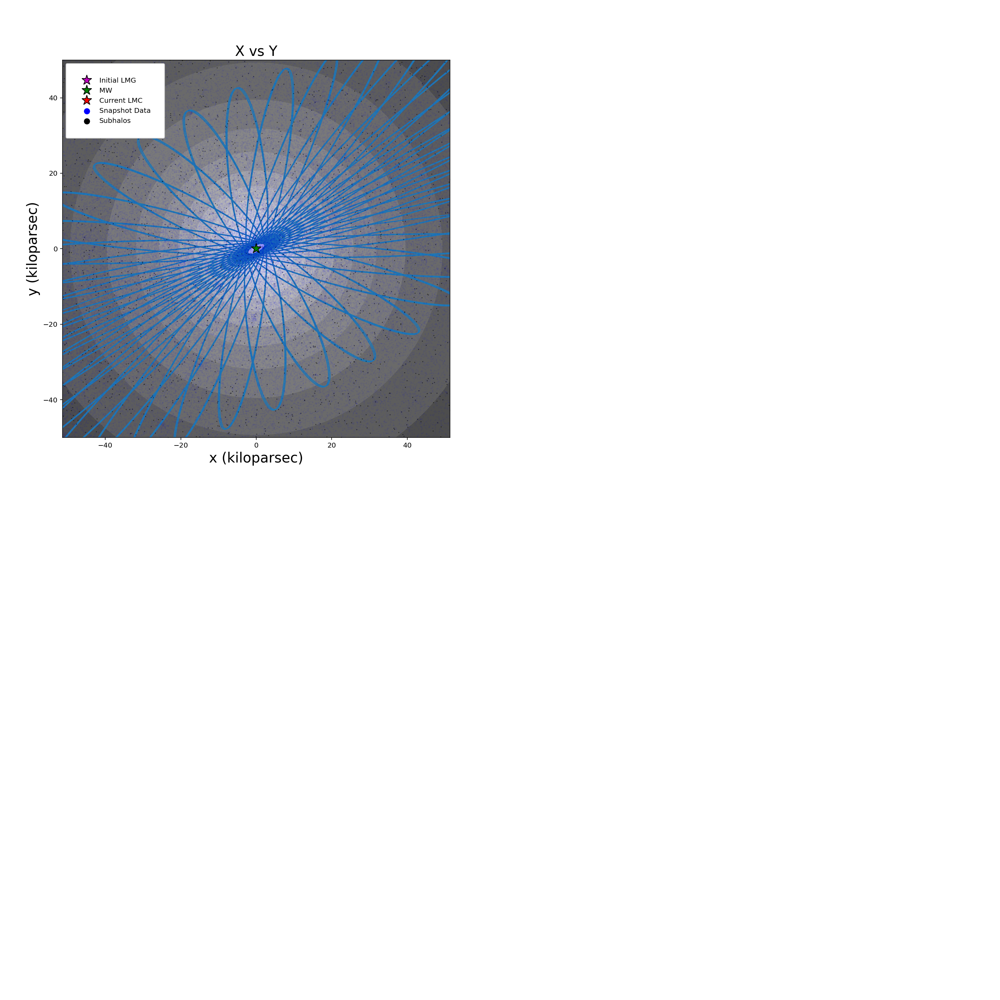

(-50.0, 50.0)

In [31]:
import astropy.units as u
import matplotlib.pyplot as plt
import numpy as np
import gala.integrate as gi
import gala.dynamics as gd
import gala.potential as gp
from gala.units import galactic


x = LMC_analog['x']*u.kpc
y = LMC_analog['y']*u.kpc
z = LMC_analog['z']*u.kpc
vx = 10*u.km/u.s
vy = 10*u.km/u.s
vz = 10*u.km/u.s
c = coord.Galactocentric(x=x, y=y, z=z, v_x=vx, v_y=vy, v_z=vz)
w0 = gd.PhaseSpacePosition(c.cartesian)
Nstep = 100000 #large step number for more definition
dt = -1*u.Myr #negative means calculating back in time 
orbit = ham.integrate_orbit(w0, dt=dt, n_steps=Nstep)
pot = gp.NFWPotential.from_circular_velocity(v_c=200*u.km/u.s,
                                             r_s=MW_analog['rs']*h*u.kpc,
                                             units=galactic)

fig,ax = plt.subplots(1, 1, figsize=(5,5))
fig.set_figwidth(10)
fig.set_figheight(10)
plt.plot(orbit.pos.x, orbit.pos.y, '-')
plt.plot(orbit.pos.x[-1], orbit.pos.y[-1], '*m', ms=15, mec='k', label='Initial LMG')
plt.gca().set_aspect('equal', adjustable='datalim')
plt.plot(subhalos_z0['x'], subhalos_z0['y'], 'k.', ms=1, alpha=0.5) #1 Mega Parsec = 1000 Kilo Parsec 
plt.plot(t['x'],t['y'],color='blue',marker='o',ms=1,ls='None', alpha = 0.03)
plt.plot(0, 0, 'g*', mec='k', ms=15, label='MW')
plt.plot(LMC_analog['x'], LMC_analog['y'], 'r*', mec='k', ms=15, alpha=1, label='Current LMC')
plt.scatter(1000,10000, marker='o', color='blue', s=60, label='Snapshot Data')
plt.scatter(1000,10000, marker='o', color='black', s=60, label='Subhalos')

grid = np.linspace(-200,200,400)
fig = pot.plot_contours(grid=(grid,grid,0), cmap='Greys', ax=ax, levels=20)
fig = orbit[-1].plot(['x', 'y'], color='#9ecae1', s=1., alpha=0.5, axes=[ax], auto_aspect=False) 

plt.xlabel('x (kiloparsec)', fontsize=20)
plt.ylabel('y (kiloparsec)', fontsize=20)
plt.title('X vs Y', fontsize=20)
plt.legend(loc='best')
plt.legend(facecolor='white', framealpha=1, borderpad=2, loc='best')
plt.xlim(-50,50)
plt.ylim(-50,50)

#use meshgrid
#we can add the potentials 

In [38]:
orbit_x = np.array(orbit.pos.x)
orbit_y = np.array(orbit.pos.y)
orbit_z = np.array(orbit.pos.z)

#new_coord = SkyCoord(ra = ra_3l1*u.degree, dec= dec_3l1*u.degree, distance = dist_3l1*u.kpc)
#new_coord_gal = new_coord.transform_to(coord.Galactocentric)
tt = Table([orbit_x, orbit_y, orbit_z], names=['orbit_x', 'orbit_y', 'orbit_z'])
tt.write('orbit_data.csv')